# Karaoke Recommender

### DATA DICTIONARY

id (string)
>The Spotify ID for the track.

acousticness (float)
>A confidence measure from 0.0 to 1.0 of whether the track is acoustic. 1.0 represents high confidence the track is acoustic.

analysis_url (string)	
>An HTTP URL to access the full audio analysis of this track. An access token is required to access this data.

danceability (float)	
>Danceability describes how suitable a track is for dancing based on a combination of musical elements including tempo, rhythm stability, beat strength, and overall regularity. A value of 0.0 is least danceable and 1.0 is most danceable.

duration_ms (int)	
>The duration of the track in milliseconds.

energy (float)	
>Energy is a measure from 0.0 to 1.0 and represents a perceptual measure of intensity and activity.
Typically, energetic tracks feel fast, loud, and noisy. For example, death metal has high energy, while a Bach prelude scores low on the scale. Perceptual features contributing to this attribute include dynamic range, perceived loudness, timbre, onset rate, and general entropy.

instrumentalness (float)
>Predicts whether a track contains no vocals. "Ooh" and "aah" sounds are treated as instrumental in this context. Rap or spoken word tracks are clearly "vocal". The closer the instrumentalness value is to 1.0, the greater likelihood the track contains no vocal content. Values above 0.5 are intended to represent instrumental tracks, but confidence is higher as the value approaches 1.0.

key (int)	
>The key the track is in. Integers map to pitches using standard Pitch Class notation. E.g. 0 = C, 1 = C♯/D♭, 2 = D, and so on.

liveness (float)
>Detects the presence of an audience in the recording. Higher liveness values represent an increased probability that the track was performed live. A value above 0.8 provides strong likelihood that the track is live.

loudness (float)
>The overall loudness of a track in decibels (dB). Loudness values are averaged across the entire track and are useful for comparing relative loudness of tracks. Loudness is the quality of a sound that is the primary psychological correlate of physical strength (amplitude). Values typical range between -60 and 0 db.

mode (int)	
>Mode indicates the modality (major or minor) of a track, the type of scale from which its melodic content is derived. Major is represented by 1 and minor is 0.

speechiness (float)	
>Speechiness detects the presence of spoken words in a track. The more exclusively speech-like the recording (e.g. talk show, audio book, poetry), the closer to 1.0 the attribute value. Values above 0.66 describe tracks that are probably made entirely of spoken words. Values between 0.33 and 0.66 describe tracks that may contain both music and speech, either in sections or layered, including such cases as rap music. Values below 0.33 most likely represent music and other non-speech-like tracks.

tempo (float)	
>The overall estimated tempo of a track in beats per minute (BPM). In musical terminology, tempo is the speed or pace of a given piece and derives directly from the average beat duration.
time_signature	int	An estimated overall time signature of a track. The time signature (meter) is a notational convention to specify how many beats are in each bar (or measure).

track_href (string)	
>A link to the Web API endpoint providing full details of the track.

type (string)	
>The object type: "audio_features"

valence	(float)	
>A measure from 0.0 to 1.0 describing the musical positiveness conveyed by a track. Tracks with high valence sound more positive (e.g. happy, cheerful, euphoric), while tracks with low valence sound more negative (e.g. sad, depressed, angry).

In [1]:
import pandas as pd
import numpy as np

In [2]:
af = pd.read_pickle('karaoke_songs_all.pkl')

In [3]:
af.reset_index(drop=True, inplace=True)

In [4]:
af[af.duplicated('Title')].sort_values(by='Title').head()

,Artist,Title,id,popularity,acousticness,analysis_url,danceability,duration_ms,energy,instrumentalness,...,liveness,loudness,mode,speechiness,tempo,time_signature,track_href,type,uri,valence
11357,Ella Fitzgerald,'Round Midnight,7dbhdnwrUE3DyRkM1ZqmWl,26,0.9530,https://api.spotify.com/v1/audio-analysis/7dbh...,0.323,207400,0.0396,0.000000,...,0.0991,-17.387,0,0.0353,94.390,4.0,https://api.spotify.com/v1/tracks/7dbhdnwrUE3D...,audio_features,spotify:track:7dbhdnwrUE3DyRkM1ZqmWl,0.138
8756,The Rolling Stones,(I Can't Get No) Satisfaction,2PzU4IB8Dr6mxV3lHuaG34,65,0.0348,https://api.spotify.com/v1/audio-analysis/2PzU...,0.725,222813,0.8530,0.127000,...,0.1960,-7.842,1,0.0353,136.282,4.0,https://api.spotify.com/v1/tracks/2PzU4IB8Dr6m...,audio_features,spotify:track:2PzU4IB8Dr6mxV3lHuaG34,0.897
10732,Michelle Simonal,(I Can't Get No) Satisfaction,5KGkkqaXYVcvKY3XaRdBaK,40,0.4710,https://api.spotify.com/v1/audio-analysis/5KGk...,0.847,212027,0.4460,0.041500,...,0.2690,-11.573,1,0.0584,119.990,4.0,https://api.spotify.com/v1/tracks/5KGkkqaXYVcv...,audio_features,spotify:track:5KGkkqaXYVcvKY3XaRdBaK,0.581
1754,Michael Bolton,(Sittin' On) The Dock Of The Bay,5MUmSoCi7ia09vhztFqk30,30,0.1930,https://api.spotify.com/v1/audio-analysis/5MUm...,0.463,232467,0.7360,0.000006,...,0.1650,-6.891,1,0.0669,178.226,4.0,https://api.spotify.com/v1/tracks/5MUmSoCi7ia0...,audio_features,spotify:track:5MUmSoCi7ia09vhztFqk30,0.508
8555,Otis Redding,(Sittin' On) The Dock Of The Bay,4Y4Gd3ty8uut6Qw43c7yJc,66,0.7880,https://api.spotify.com/v1/audio-analysis/4Y4G...,0.741,162213,0.2800,0.000010,...,0.0668,-12.982,0,0.0340,103.581,4.0,https://api.spotify.com/v1/tracks/4Y4Gd3ty8uut...,audio_features,spotify:track:4Y4Gd3ty8uut6Qw43c7yJc,0.513


In [5]:
# strip spaces
af['Title'] = af['Title'].str.strip()
af['Artist'] = af['Artist'].str.strip()

In [6]:
# pickle dataframe
import pickle

with open('karaoke_songs_final.pkl', 'w') as ks:
    pickle.dump(af, ks)

In [7]:
# open pickled dataframe
with open('karaoke_songs_final.pkl', 'r') as ks:
    af = pickle.load(ks)

In [8]:
# check unique values for column 'type'
af['type'].unique()

array([u'audio_features'], dtype=object)

In [9]:
# check unique values for column 'mode'
af['mode'].unique()

array([1, 0])

In [10]:
# drop columns ('analysis_url','track_href','type','uri')
af.drop(['analysis_url','track_href','type','uri'],axis=1,inplace=True)

In [11]:
af['popularity']=af['popularity'].astype('int')

In [12]:
# check types for columns
af.dtypes

Artist               object
Title                object
id                   object
popularity            int64
acousticness        float64
danceability        float64
duration_ms           int64
energy              float64
instrumentalness    float64
key                   int64
liveness            float64
loudness            float64
mode                  int64
speechiness         float64
tempo               float64
time_signature      float64
valence             float64
dtype: object

In [13]:
# Check for nulls
af[pd.isnull(af).any(axis=1)]

,Artist,Title,id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
11466,Boyce Avenue,A Thousand Years,4IQgYbZghcFHBBye6aff45,54,0.768,0.434,263710,0.221,0.0,5,0.106,-11.672,1,0.0329,126.392,NaN,0.219


In [14]:
af.loc[(af.Artist == 'Boyce Avenue') & (af.Title == 'A Thousand Years'),'time_signature'] = 4.0

In [15]:
# Describe audio features 
af.describe()

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
count,12004.000000,12004.000000,12004.000000,1.200400e+04,12004.000000,12004.000000,12004.000000,12004.000000,12004.000000,12004.000000,12004.000000,12004.000000,12004.000000,12004.000000
mean,37.572726,0.301707,0.569867,2.251056e+05,0.614514,0.042026,5.237837,0.191431,-8.137436,0.742752,0.057693,121.900611,3.922609,0.541899
std,19.351296,0.305210,0.149405,6.074430e+04,0.229767,0.159680,3.530092,0.162741,3.782094,0.437135,0.056280,28.979082,0.341413,0.247344
min,0.000000,0.000002,0.080100,2.480000e+04,0.000020,0.000000,0.000000,0.012800,-33.911000,0.000000,0.022200,35.219000,1.000000,0.021500
25%,25.000000,0.031300,0.474000,1.898400e+05,0.444000,0.000000,2.000000,0.094500,-10.388000,0.000000,0.031500,100.016750,4.000000,0.340000
50%,39.000000,0.181000,0.580000,2.196655e+05,0.644000,0.000005,5.000000,0.128000,-7.367000,1.000000,0.039100,120.652500,4.000000,0.545000
75%,51.000000,0.539250,0.675000,2.517398e+05,0.808000,0.000545,8.000000,0.241000,-5.281750,1.000000,0.057600,138.278750,4.000000,0.747000
max,100.000000,0.996000,0.978000,1.694907e+06,0.997000,0.979000,11.000000,0.998000,-0.165000,1.000000,0.919000,217.966000,5.000000,1.000000


In [16]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use('ggplot')
%matplotlib inline

In [19]:
# Correlation between various features
af_corr = af.corr()
af_corr

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
popularity,1.000000,-0.073731,0.023866,0.094273,0.108341,-0.261127,-0.007340,-0.041328,0.187771,-0.038799,0.069205,-0.002295,0.027844,-0.010092
acousticness,-0.073731,1.000000,-0.254800,-0.156687,-0.722518,-0.014338,-0.021482,-0.031913,-0.531786,0.118981,-0.089994,-0.156294,-0.198070,-0.262587
danceability,0.023866,-0.254800,1.000000,-0.054473,0.206454,0.009389,0.009485,-0.103937,0.120671,-0.120620,0.125657,-0.142487,0.189709,0.522973
duration_ms,0.094273,-0.156687,-0.054473,1.000000,0.039790,0.024241,0.002155,0.014990,0.017402,-0.075624,0.013086,-0.025724,0.016827,-0.225150
energy,0.108341,-0.722518,0.206454,0.039790,1.000000,-0.072785,0.026270,0.146315,0.757118,-0.106875,0.167448,0.205431,0.217481,0.415819
instrumentalness,-0.261127,-0.014338,0.009389,0.024241,-0.072785,1.000000,-0.000575,-0.027916,-0.216435,-0.005703,-0.036032,-0.003015,-0.010681,-0.034170
key,-0.007340,-0.021482,0.009485,0.002155,0.026270,-0.000575,1.000000,-0.017941,0.012729,-0.112814,0.026233,-0.002427,-0.000971,0.019428
liveness,-0.041328,-0.031913,-0.103937,0.014990,0.146315,-0.027916,-0.017941,1.000000,0.074412,0.009576,0.137198,0.013182,0.008746,0.035450
loudness,0.187771,-0.531786,0.120671,0.017402,0.757118,-0.216435,0.012729,0.074412,1.000000,-0.066221,0.088403,0.150234,0.147833,0.163995
mode,-0.038799,0.118981,-0.120620,-0.075624,-0.106875,-0.005703,-0.112814,0.009576,-0.066221,1.000000,-0.103164,0.018262,-0.029577,-0.036225


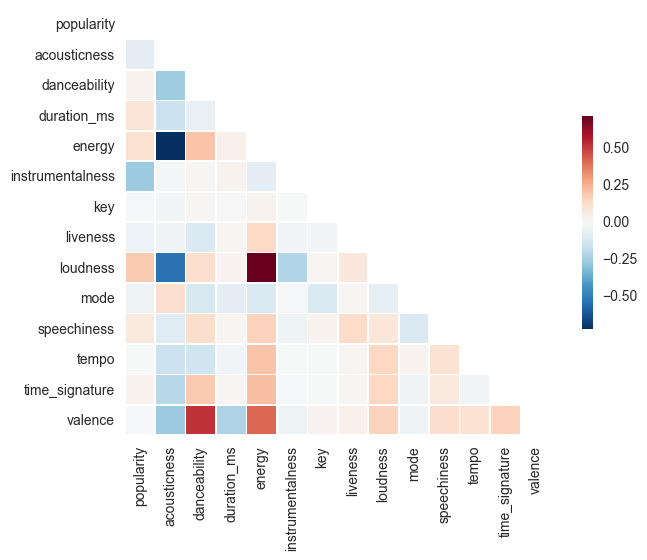

In [20]:
sns.set(style="white")

# Generate a mask for the upper triangle
mask = np.zeros_like(af_corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(af_corr, mask=mask, vmax=.3,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

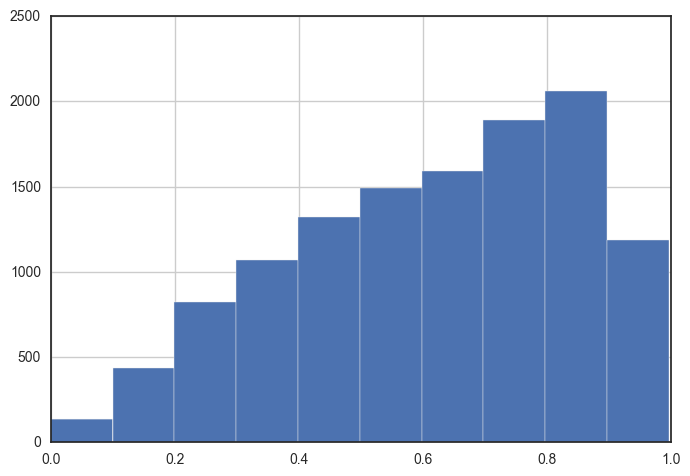

In [53]:
af['energy'].hist()

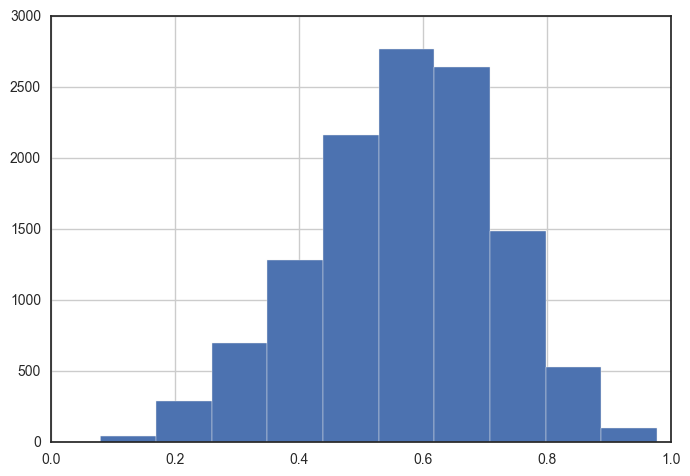

In [54]:
af['danceability'].hist()

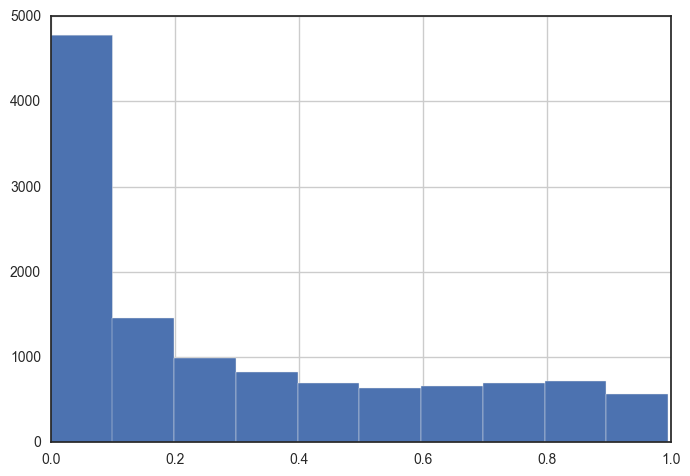

In [55]:
af['acousticness'].hist()

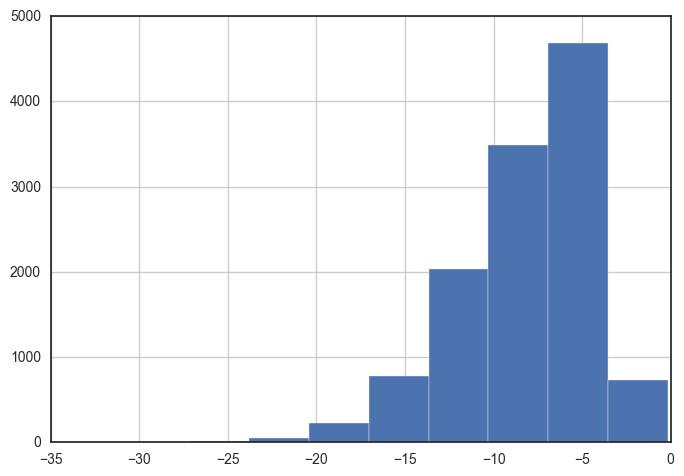

In [56]:
af['loudness'].hist()

# DATA MINING

In [27]:
import math
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA 
from sklearn.preprocessing import LabelEncoder

In [28]:
af.T

,0,1,2,3,4,5,6,7,8,9,...,11994,11995,11996,11997,11998,11999,12000,12001,12002,12003
Artist,Elvis Presley,Dr. Hook & The Medicine Show,Eddie Cochran,Beyoncé,My Chemical Romance,Jack Johnson,Randy Travis,Eva Cassidy,Goo Goo Dolls,Lorrie Morgan,...,Glee,Salsoul Orchestra,Bobby Helms,John Cafferty & The Beaver Brown Band,Michael Bublé,The Four Tops,Diana Ross,Amy Winehouse,Chris Young,Lonestar
Title,You Don't Know Me,Walk Right In,C'mon Everybody,Ego,I'm Not Okay (I Promise),Someday At Christmas,An Old Pair Of Shoes,Need Your Love So Bad,Name,Five Minutes,...,Get It Right,Little Drummer Boy,My Special Angel,On The Dark Side,Call Me Irresponsible,Reach Out (I'll Be There),When You Tell Me That You Love Me,The Girl From Ipanema,The Man I Want To Be,I'm Already There
id,4BWVBdeEiPcXP5KVcWCeO3,6v9UOHsr45DOHTV5ktvNRc,7Lfp7FsKI4buEJYbMlt7QU,6GcuA4J9ruyClBizBd4m5E,7lRlq939cDG4SzWOF4VAnd,6ShAxK5egTFaalJMty15Si,5gwAf1bzkN7k22GQMopCQ9,2BlAyv83CxlxxdiFFXBH42,1G8jae4jD8mwkXdodqHsBM,0b0jfxRfqfbOVOORCqfIhi,...,2IIdrejPZuHHFpc3LbTtEK,5YriovJ2avH92qrIxdzBvb,700OFVcv0ARG2QrFPDjHNO,7DhNAYOzIRkEFqimYl2s1G,4T6HLdP6OcAtqC6tGnQelG,2Y8wN1dpvzHdjV5cwza5wV,2bWTFMYMcJQptHUZuDvC8P,7F5rIyOI88zk36AiBXC8xq,5zMRkxgFscsPItPsMy4ItS,34Vn9nKfztyLco9lJazy4j
popularity,26,19,44,58,67,50,0,9,59,29,...,49,24,9,40,72,34,45,50,54,55
acousticness,0.924,0.0388,0.134,0.155,0.00602,0.612,0.141,0.208,0.0691,0.454,...,0.331,0.00164,0.776,0.0357,0.39,0.128,0.293,0.312,0.635,0.61
danceability,0.407,0.808,0.633,0.623,0.21,0.801,0.762,0.595,0.464,0.754,...,0.419,0.677,0.559,0.392,0.686,0.619,0.532,0.688,0.489,0.377
duration_ms,147360,185760,116560,236360,186480,130760,171632,278827,270000,212320,...,227853,359000,173093,161827,212373,181280,236240,166960,207213,253373
energy,0.22,0.948,0.699,0.389,0.94,0.192,0.345,0.375,0.701,0.402,...,0.549,0.505,0.376,0.727,0.688,0.846,0.553,0.616,0.498,0.395
instrumentalness,0.0298,0.0024,0.000146,0,0,0,0.00137,3.79e-06,0.00182,7.89e-05,...,0,0.539,2.4e-05,0.000239,1.03e-06,0,0,4.96e-06,1.91e-06,0
key,11,2,3,1,9,0,3,9,9,7,...,2,9,0,9,6,3,4,9,7,3


In [116]:
x = af[['acousticness','loudness']]
X = StandardScaler().fit_transform(x)

# MODELING

## KMEANS

In [117]:
from sklearn.metrics import pairwise_distances
from sklearn import cluster, preprocessing, metrics

In [118]:
X.shape

(12004, 2)

In [119]:
k = 2
kmeans = cluster.KMeans(n_clusters=k)
kmeans.fit(X)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=2, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [120]:
labels = kmeans.labels_
centroids = kmeans.cluster_centers_
inertia = kmeans.inertia_

In [121]:
centroids

array([[-0.57959582,  0.46047891],
       [ 1.16413056, -0.92488171]])

In [122]:
metrics.silhouette_score(X, labels, metric='euclidean')

0.51599925198746099

In [123]:
Xk = pd.DataFrame(X)

In [124]:
Xk['cluster']= pd.Series(labels)

In [125]:
Xk['cluster']= Xk['cluster'].astype(float)

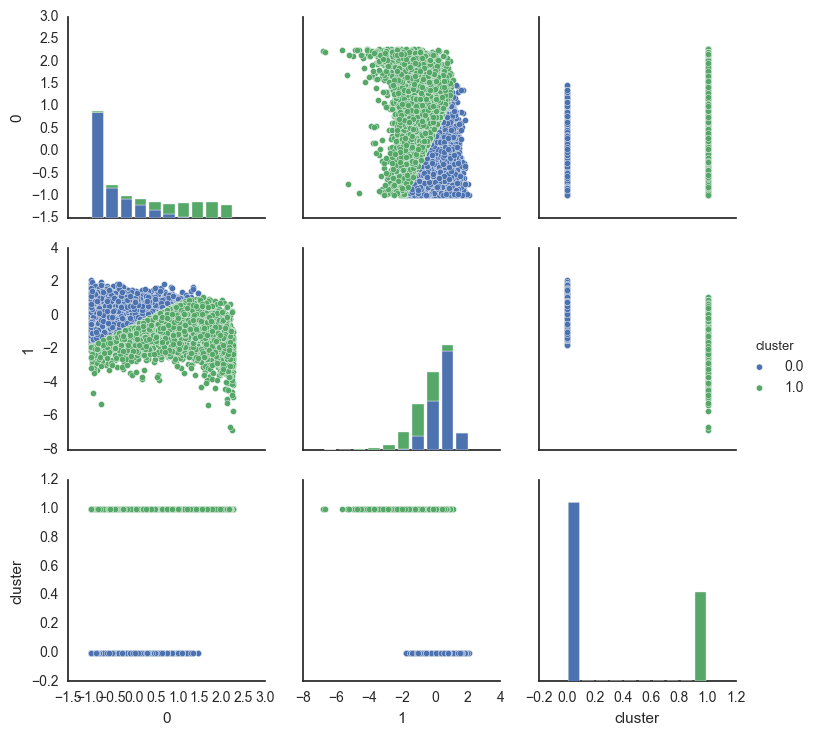

In [126]:
sns.pairplot(Xk, hue='cluster')

Automatically created module for IPython interactive environment
('For n_clusters =', 2, 'The average silhouette_score is :', 0.51599925198746099)


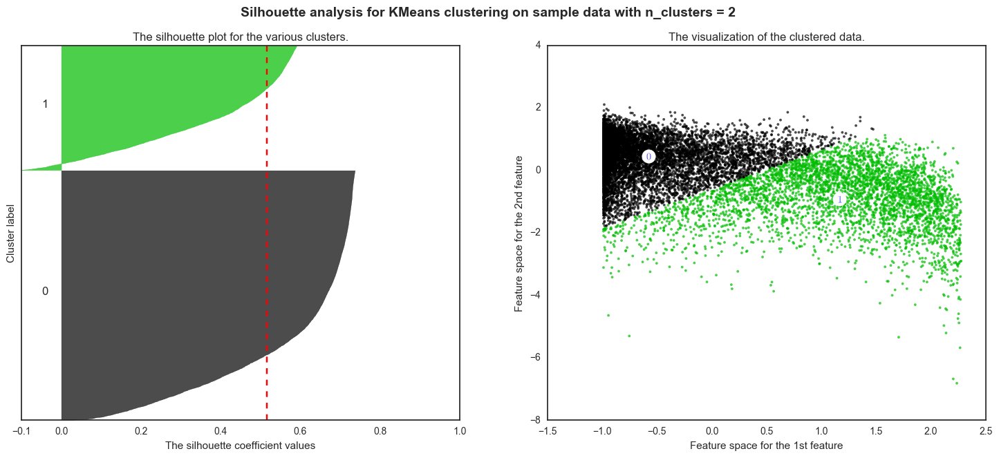

('For n_clusters =', 3, 'The average silhouette_score is :', 0.44355938224956798)


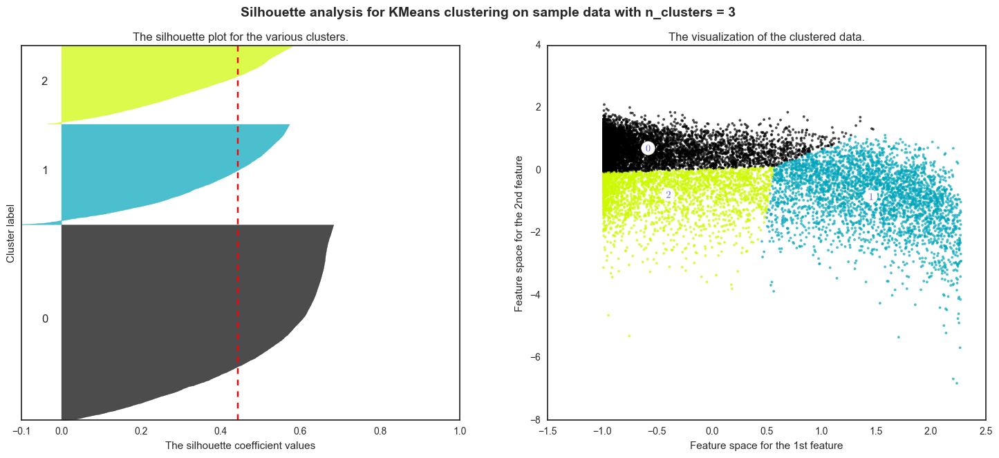

('For n_clusters =', 4, 'The average silhouette_score is :', 0.46739016394116001)


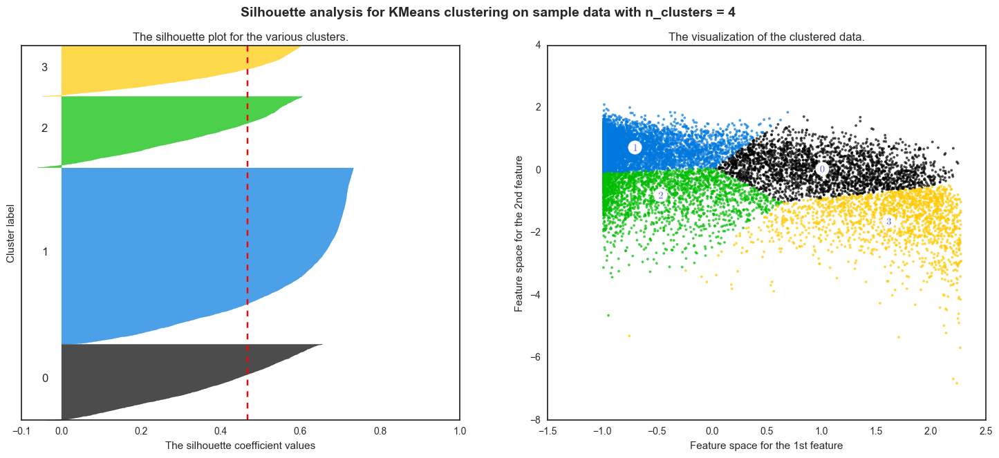

('For n_clusters =', 5, 'The average silhouette_score is :', 0.44471007102043636)


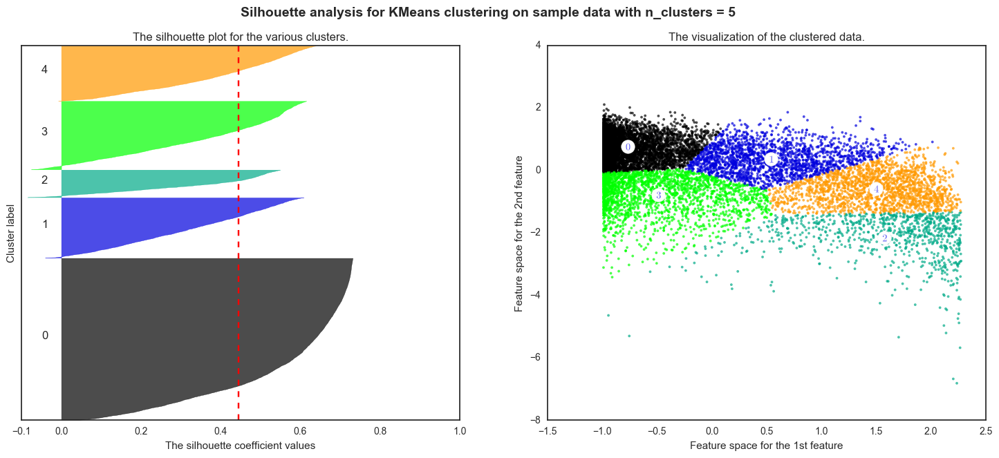

('For n_clusters =', 6, 'The average silhouette_score is :', 0.39584707275384445)


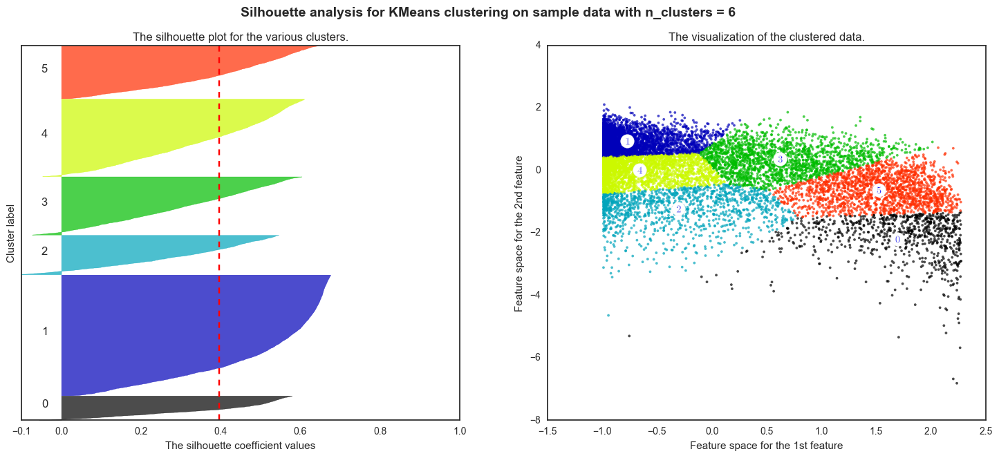

('For n_clusters =', 7, 'The average silhouette_score is :', 0.39114127958944656)


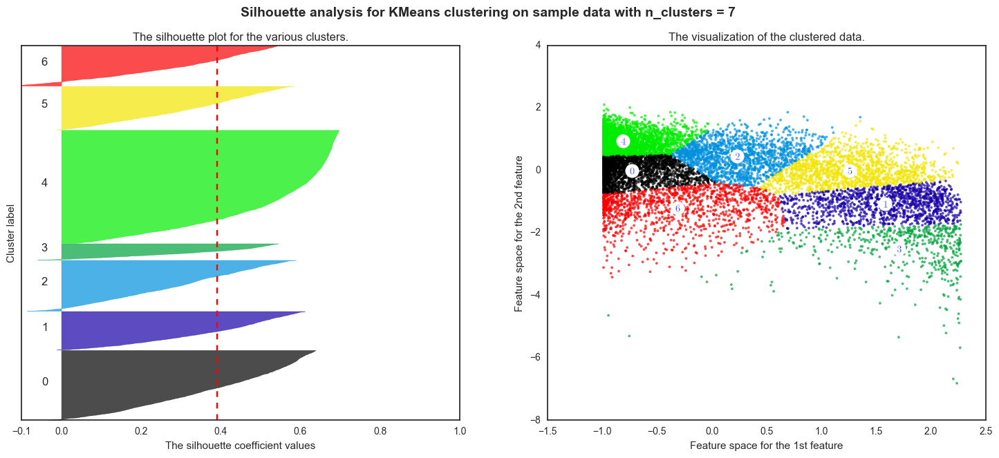

('For n_clusters =', 8, 'The average silhouette_score is :', 0.40427464773028038)


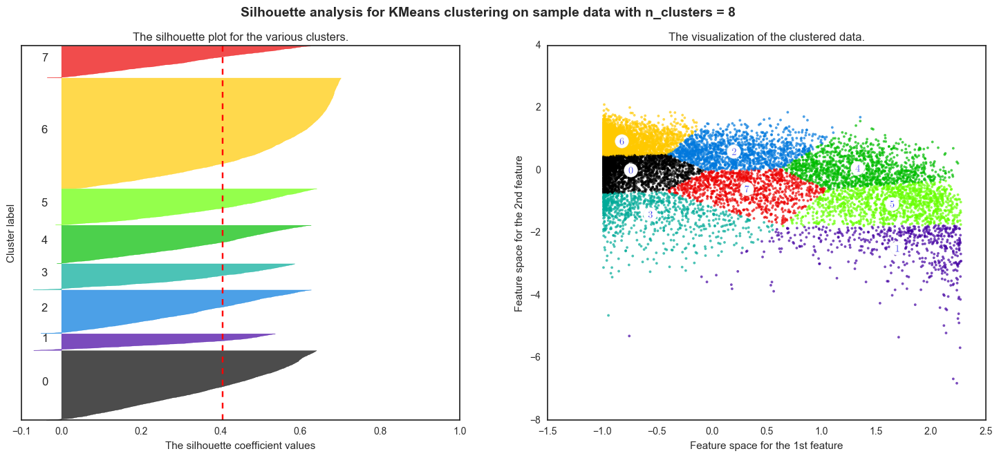

('For n_clusters =', 9, 'The average silhouette_score is :', 0.38115226361827415)


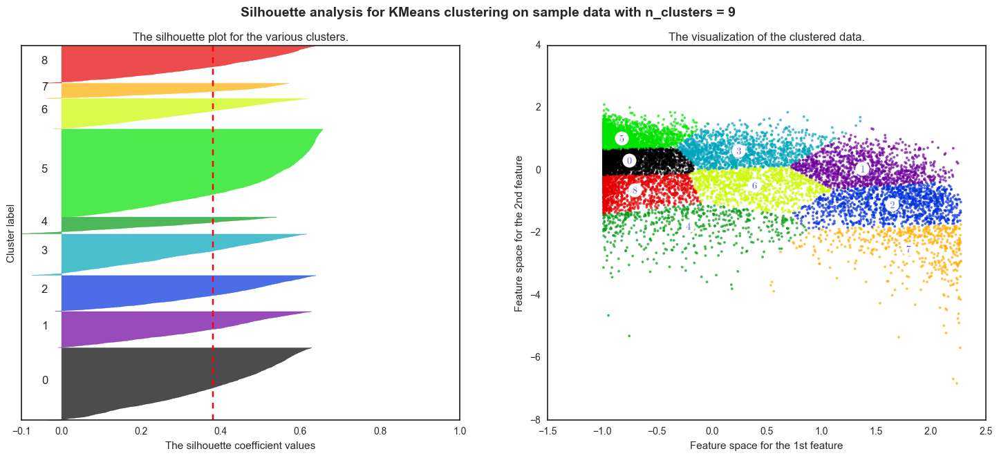

('For n_clusters =', 10, 'The average silhouette_score is :', 0.37646665304934845)


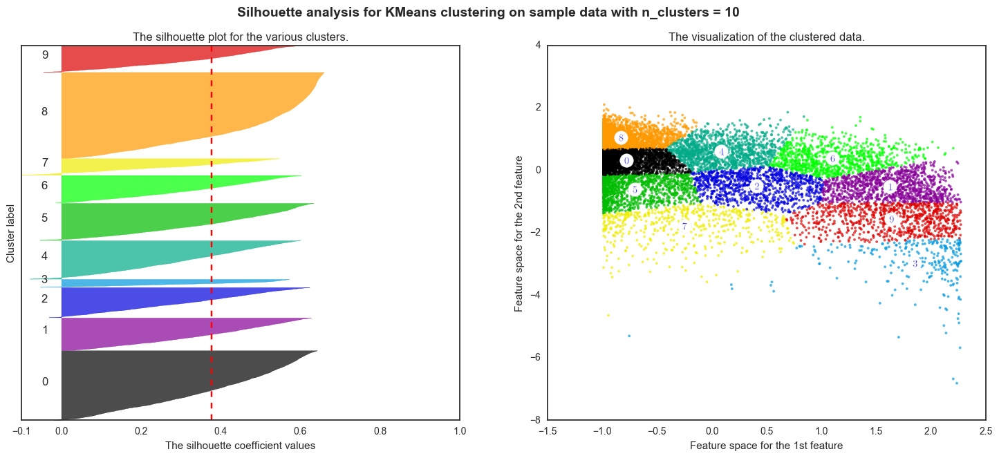

('For n_clusters =', 11, 'The average silhouette_score is :', 0.38113257084334246)


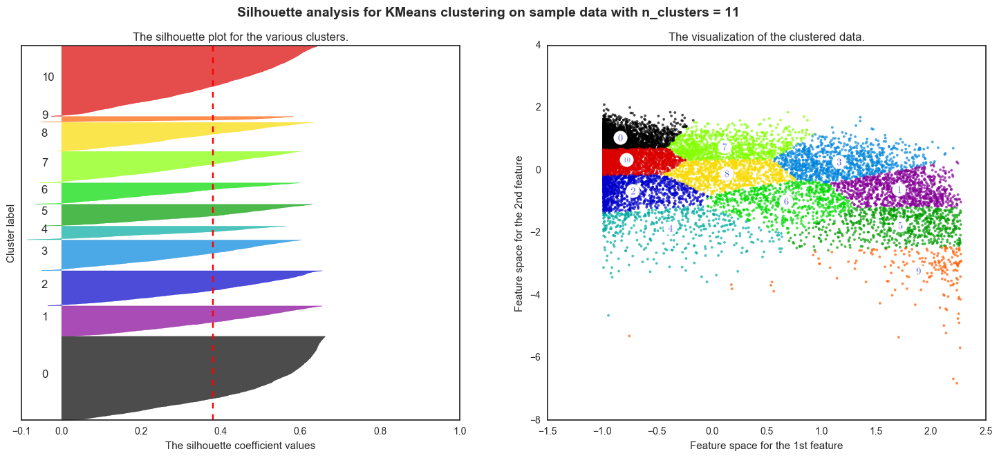

('For n_clusters =', 12, 'The average silhouette_score is :', 0.36015986160683072)


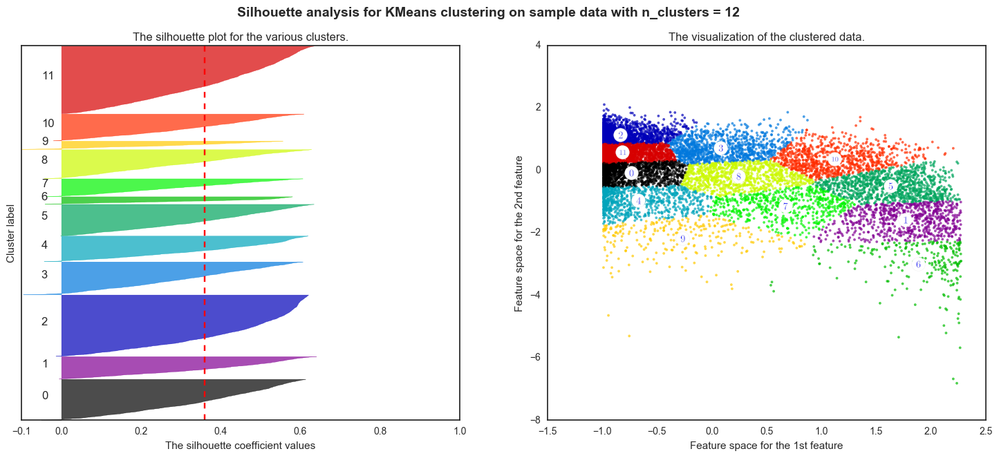

('For n_clusters =', 13, 'The average silhouette_score is :', 0.35929772621082862)


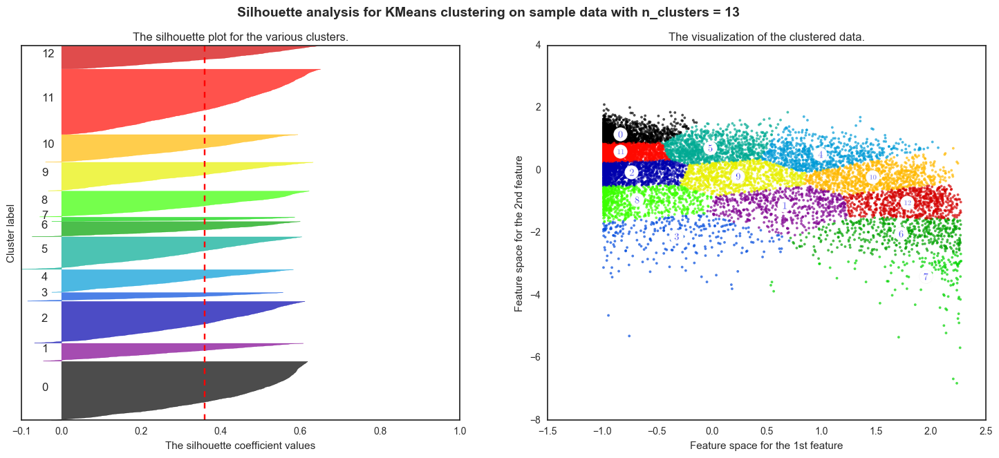

('For n_clusters =', 14, 'The average silhouette_score is :', 0.36663103091703686)


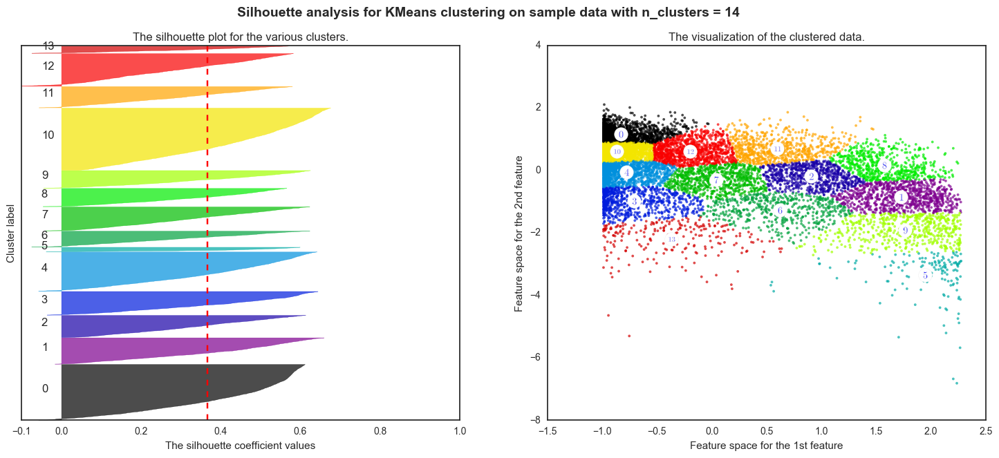

('For n_clusters =', 15, 'The average silhouette_score is :', 0.35466590088677491)


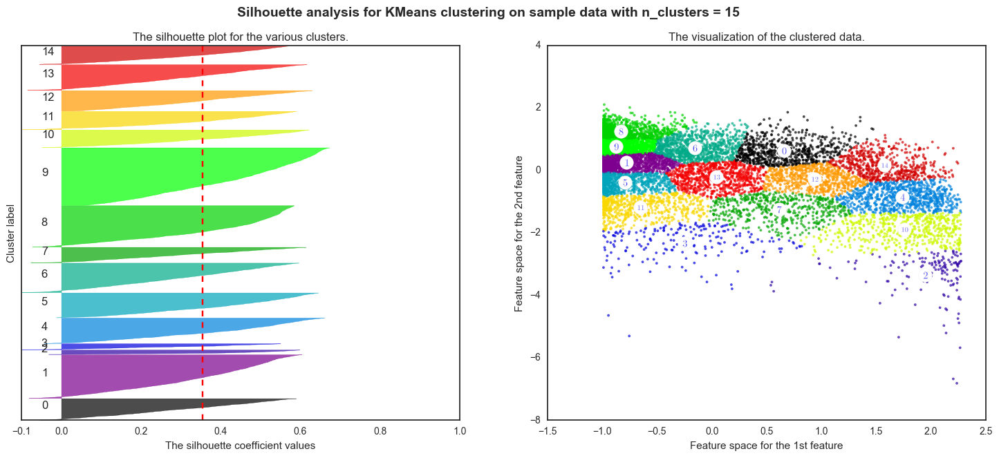

In [127]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.cm as cm


print(__doc__)

# Generating the sample data from make_blobs

range_n_clusters = [2,3,4,5,6,7,8,9,10,11,12,13,14,15]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors)

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1],
                marker='o', c="white", alpha=1, s=200)

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1, s=50)

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

    plt.show()

In [128]:
loud_acou = pd.concat([af, Xk],axis=1)

In [129]:
loud_acou[loud_acou['cluster'] ==1]

,Artist,Title,id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,0,1,cluster
0,Elvis Presley,You Don't Know Me,4BWVBdeEiPcXP5KVcWCeO3,26,0.9240,0.407,147360,0.220,0.029800,11,0.1120,-15.468,1,0.0410,83.605,3.0,0.2190,2.038988,-1.938310,1.0
5,Jack Johnson,Someday At Christmas,6ShAxK5egTFaalJMty15Si,50,0.6120,0.801,130760,0.192,0.000000,0,0.1320,-10.282,1,0.0557,104.189,4.0,0.5940,1.016698,-0.567054,1.0
9,Lorrie Morgan,Five Minutes,0b0jfxRfqfbOVOORCqfIhi,29,0.4540,0.754,212320,0.402,0.000079,7,0.1170,-11.712,1,0.0313,116.998,4.0,0.7370,0.498999,-0.945168,1.0
14,Little Shop Of Horrors,Somewhere That's Green,7CURZrxixLSuW41vklxQFk,36,0.8640,0.466,250587,0.110,0.000000,7,0.0838,-15.872,1,0.0634,101.211,4.0,0.2220,1.842394,-2.045133,1.0
17,Roger Whittaker,Yellow Bird,4gjRjLWZBEQe8tiBhOiJfL,0,0.0718,0.745,141098,0.159,0.851000,0,0.1040,-28.190,1,0.0539,114.291,4.0,0.5100,-0.753306,-5.302195,1.0
18,Teach-In,Ding-A-Dong,4ARCWS3l327M1YulCf74Uu,31,0.5120,0.708,149573,0.561,0.000002,9,0.1410,-15.148,0,0.0367,139.199,4.0,0.9380,0.689041,-1.853697,1.0
21,Bon Jovi,Bed Of Roses (Acoustic),316AJrVNhDSMhLy7pfEdNf,18,0.8400,0.499,348720,0.241,0.000000,5,0.1010,-10.109,1,0.0322,166.061,3.0,0.1600,1.763756,-0.521311,1.0
22,Peter Cincotti,Sway,2DPBgT4BHfawknU40BZ1gg,22,0.6440,0.600,250750,0.320,0.006470,11,0.0877,-12.473,0,0.0926,203.919,4.0,0.2710,1.121548,-1.146387,1.0
23,Tammy Wynette,D-I-V-O-R-C-E,5f38UWziNmvOjdMHvwxsL9,40,0.8360,0.619,175253,0.330,0.000000,9,0.1540,-11.332,1,0.0295,99.353,4.0,0.5670,1.750650,-0.844690,1.0
25,South Pacific,Happy Talk,6LQCSMyENrtwIyZVScawNS,22,0.8060,0.394,223667,0.292,0.000000,2,0.1270,-11.817,1,0.0497,185.213,4.0,0.4140,1.652352,-0.972931,1.0


In [130]:
loud_acou[loud_acou['cluster'] ==0]

,Artist,Title,id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,0,1,cluster
1,Dr. Hook & The Medicine Show,Walk Right In,6v9UOHsr45DOHTV5ktvNRc,19,0.038800,0.808,185760,0.948,0.002400,2,0.1020,-5.375,1,0.0386,114.734,4.0,0.8770,-0.861433,0.730429,0.0
2,Eddie Cochran,C'mon Everybody,7Lfp7FsKI4buEJYbMlt7QU,44,0.134000,0.633,116560,0.699,0.000146,3,0.1260,-10.612,1,0.0429,175.302,4.0,0.8960,-0.549503,-0.654311,0.0
3,Beyoncé,Ego,6GcuA4J9ruyClBizBd4m5E,58,0.155000,0.623,236360,0.389,0.000000,1,0.1630,-7.816,1,0.2410,79.454,4.0,0.5060,-0.480695,0.084992,0.0
4,My Chemical Romance,I'm Not Okay (I Promise),7lRlq939cDG4SzWOF4VAnd,67,0.006020,0.210,186480,0.940,0.000000,9,0.2690,-3.427,1,0.1230,179.722,4.0,0.2540,-0.968839,1.245509,0.0
6,Randy Travis,An Old Pair Of Shoes,5gwAf1bzkN7k22GQMopCQ9,0,0.141000,0.762,171632,0.345,0.001370,3,0.1410,-11.314,1,0.0288,120.781,4.0,0.6840,-0.526567,-0.839931,0.0
7,Eva Cassidy,Need Your Love So Bad,2BlAyv83CxlxxdiFFXBH42,9,0.208000,0.595,278827,0.375,0.000004,9,0.1060,-10.301,1,0.0372,80.287,3.0,0.1910,-0.307037,-0.572078,0.0
8,Goo Goo Dolls,Name,1G8jae4jD8mwkXdodqHsBM,59,0.069100,0.464,270000,0.701,0.001820,9,0.0766,-5.943,1,0.0341,73.970,4.0,0.4060,-0.762153,0.580241,0.0
10,Cats On Trees,Sirens Call,39mFHYM8K21BtSp2GfQjUG,45,0.510000,0.510,223947,0.671,0.000002,2,0.1220,-6.723,0,0.0266,135.984,4.0,0.2710,0.682487,0.373998,0.0
11,Roxette,Sleeping In My Car,0CicjlSiN0HdzD2nigN9j4,44,0.012300,0.546,214160,0.850,0.000000,6,0.1930,-4.315,1,0.0322,135.162,4.0,0.5820,-0.948262,1.010709,0.0
12,Blackfoot,"Train, Train",5bSpsKGoGKXOOfg7F3ZtKz,44,0.015000,0.609,216693,0.807,0.001230,9,0.3700,-8.286,1,0.0559,121.768,4.0,0.7560,-0.939415,-0.039282,0.0


In [136]:
x3 = af[['acousticness','loudness','danceability']]
X3 = StandardScaler().fit_transform(x3)

In [137]:
k = 3
kmeans3 = cluster.KMeans(n_clusters=k)
kmeans3.fit(X3)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=3, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [138]:
labels3 = kmeans3.labels_
centroids3 = kmeans3.cluster_centers_
inertia3 = kmeans3.inertia_

In [139]:
centroids3

array([[-0.58221462,  0.60238974, -0.60351661],
       [-0.42662215,  0.1773026 ,  0.88323551],
       [ 1.33482055, -0.99944923, -0.53162659]])

In [140]:
metrics.silhouette_score(X3, labels3, metric='euclidean')

0.29233776134535677

In [141]:
Xk3 = pd.DataFrame(X3)

In [142]:
Xk3['cluster']= pd.Series(labels3)

In [143]:
Xk3['cluster']= pd.Series(labels3)

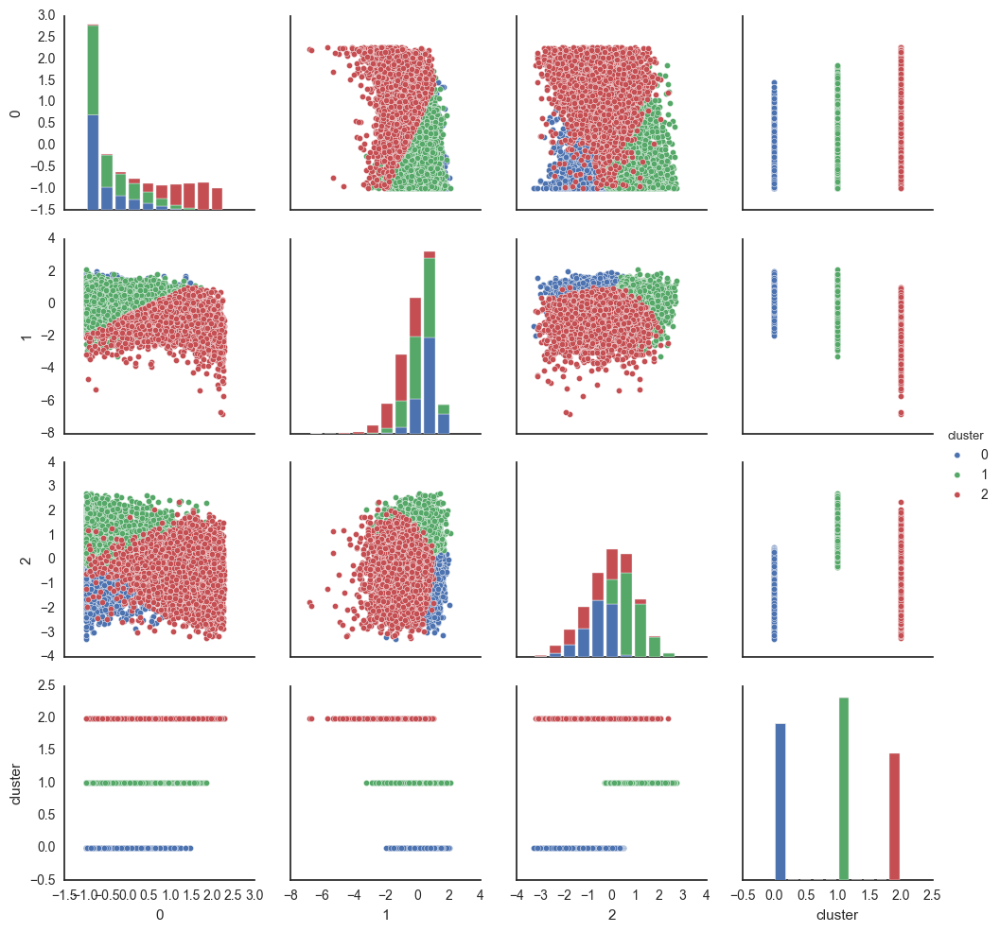

In [144]:
sns.pairplot(Xk3, hue='cluster')

Automatically created module for IPython interactive environment
('For n_clusters =', 2, 'The average silhouette_score is :', 0.39187976727780816)


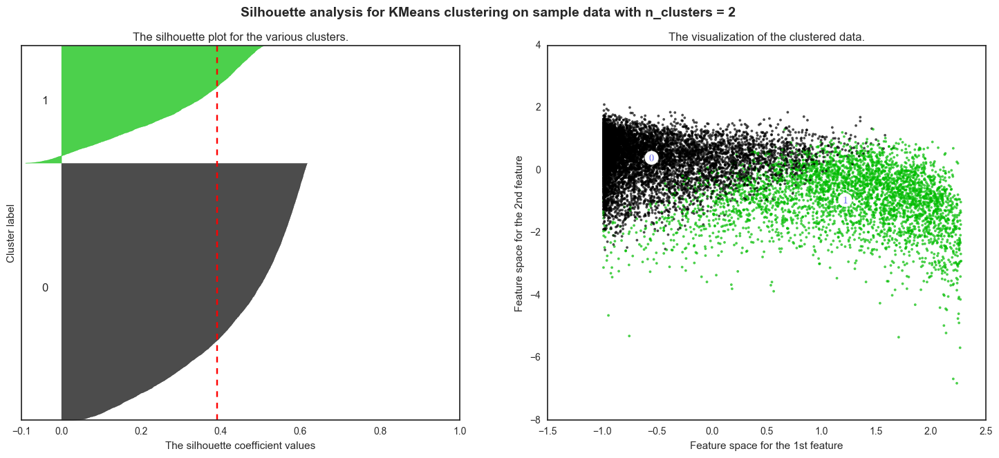

('For n_clusters =', 3, 'The average silhouette_score is :', 0.29233930267235941)


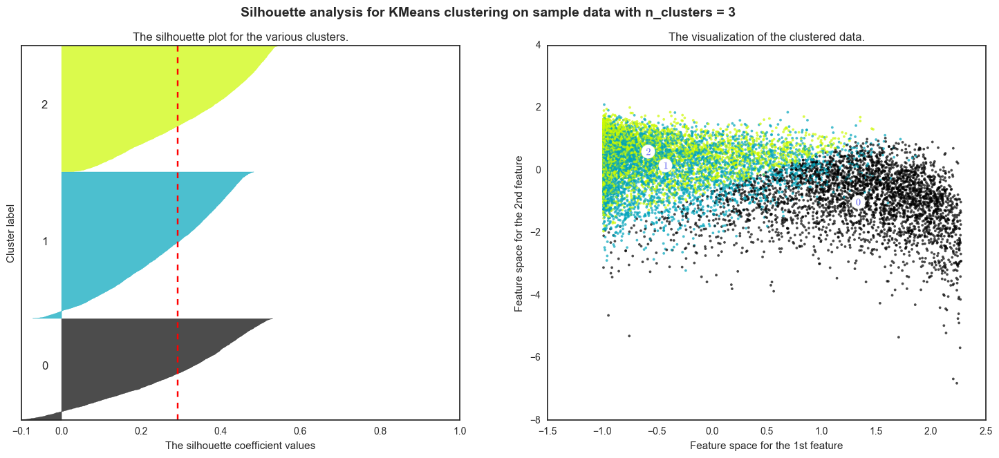

('For n_clusters =', 4, 'The average silhouette_score is :', 0.28331520899550472)


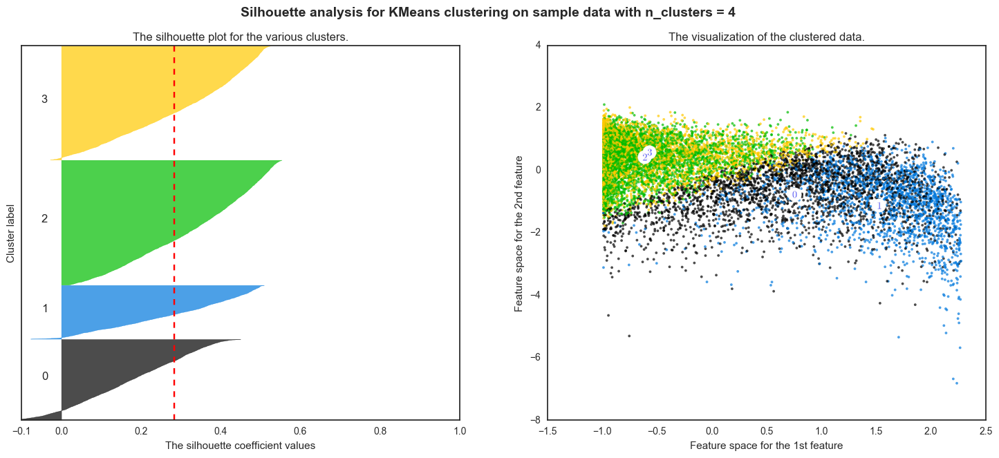

('For n_clusters =', 5, 'The average silhouette_score is :', 0.29834537609800299)


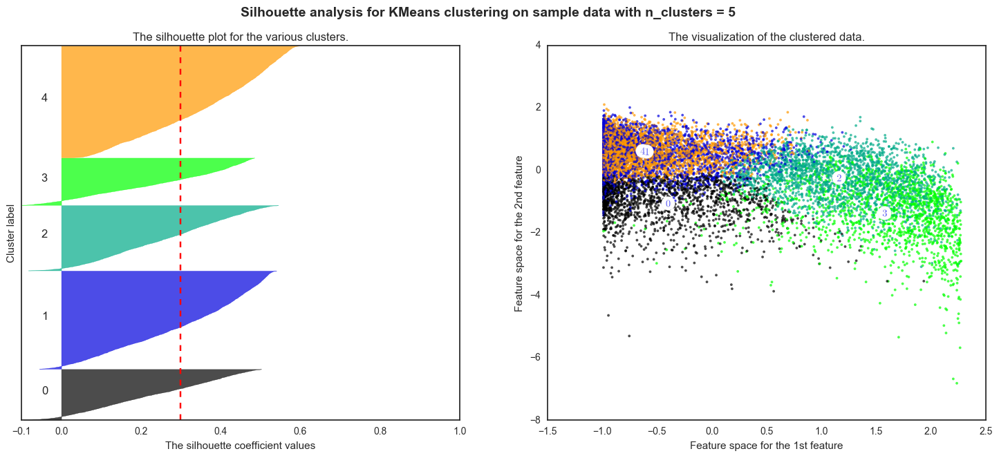

('For n_clusters =', 6, 'The average silhouette_score is :', 0.29566080261767264)


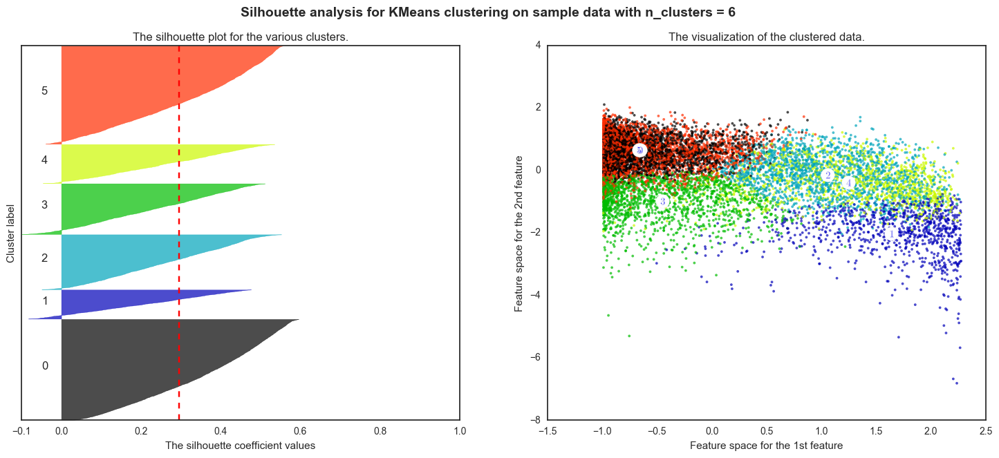

('For n_clusters =', 7, 'The average silhouette_score is :', 0.27475580205142375)


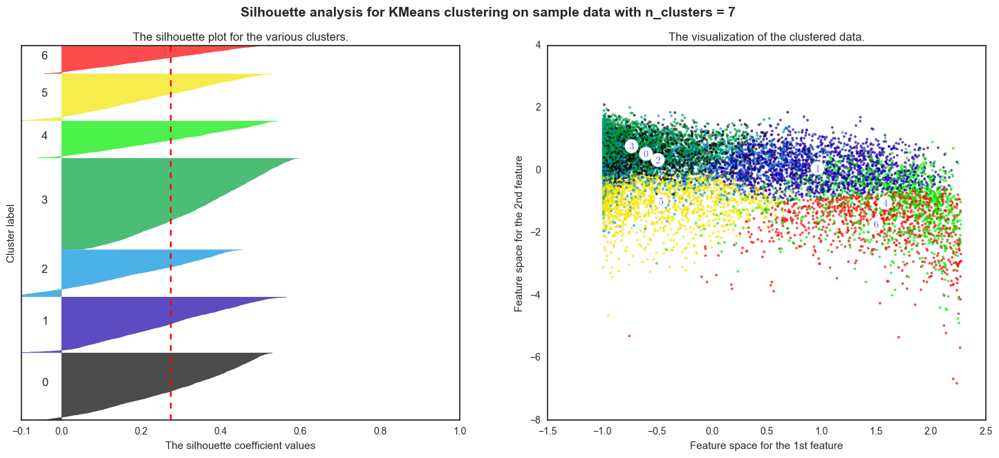

('For n_clusters =', 8, 'The average silhouette_score is :', 0.27113767147396806)


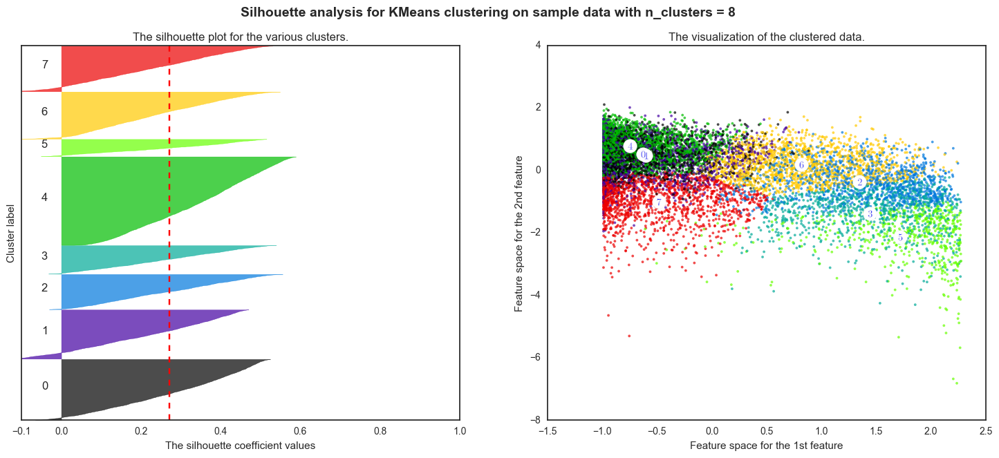

('For n_clusters =', 9, 'The average silhouette_score is :', 0.27141431014908401)


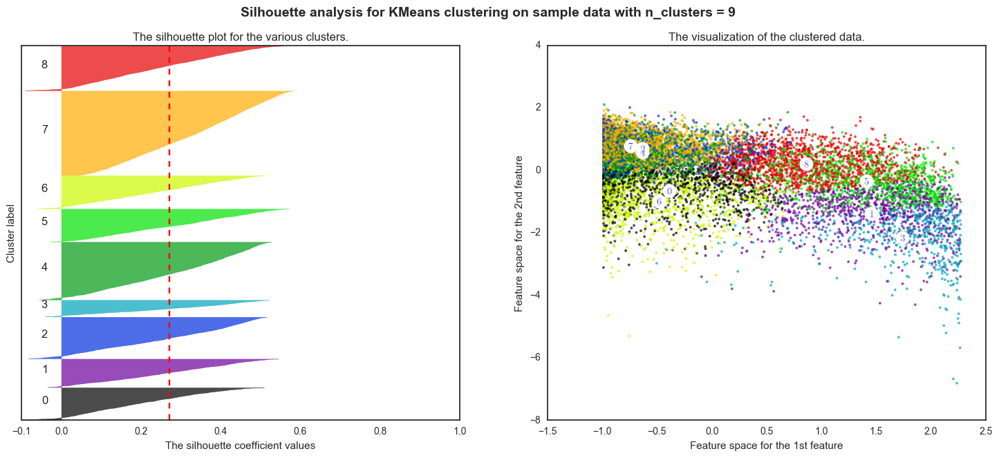

('For n_clusters =', 10, 'The average silhouette_score is :', 0.25523271044927948)


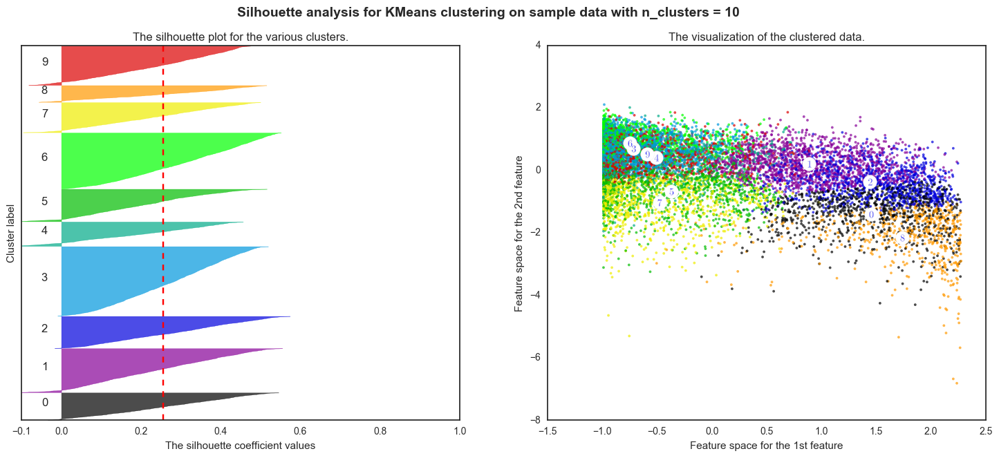

('For n_clusters =', 11, 'The average silhouette_score is :', 0.25371487515879687)


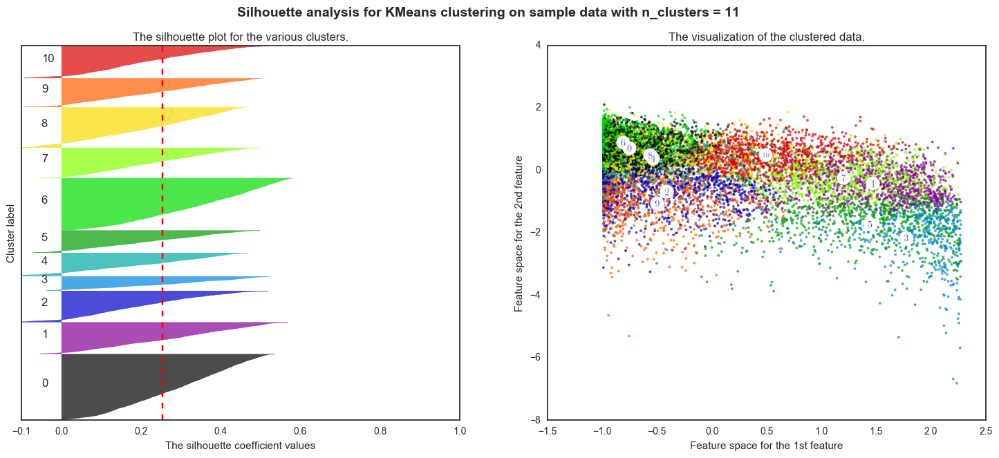

('For n_clusters =', 12, 'The average silhouette_score is :', 0.25640743973609548)


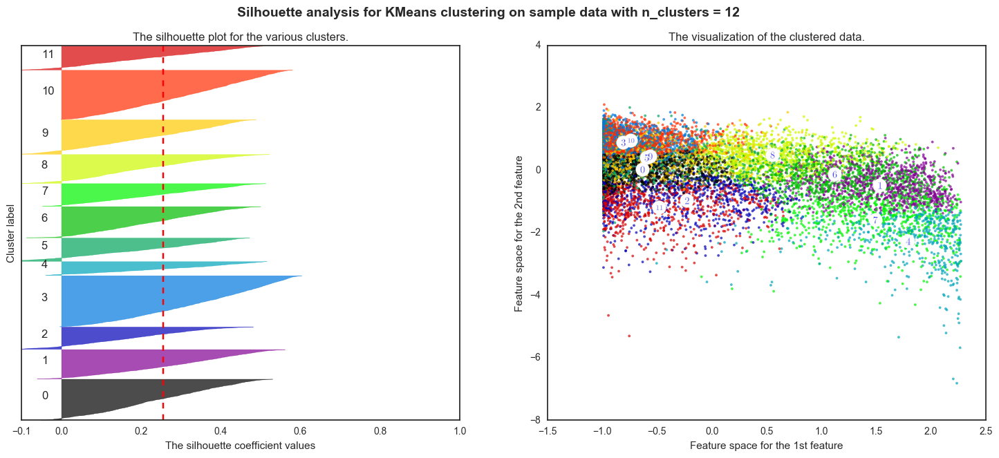

('For n_clusters =', 13, 'The average silhouette_score is :', 0.25657027199821031)


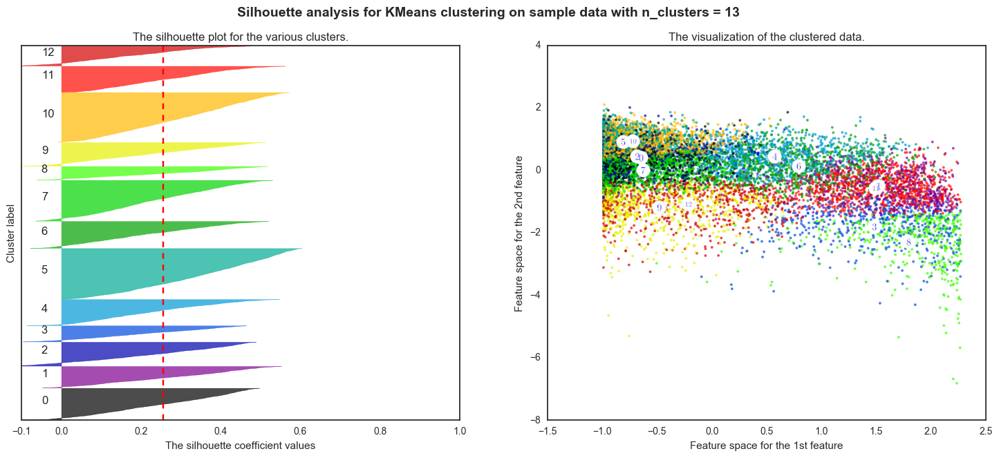

('For n_clusters =', 14, 'The average silhouette_score is :', 0.25464771646123574)


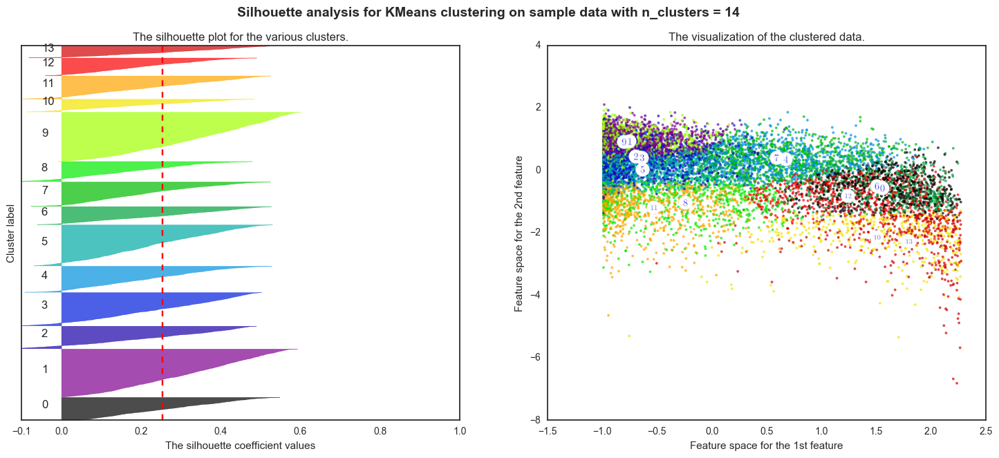

('For n_clusters =', 15, 'The average silhouette_score is :', 0.25310786623639381)


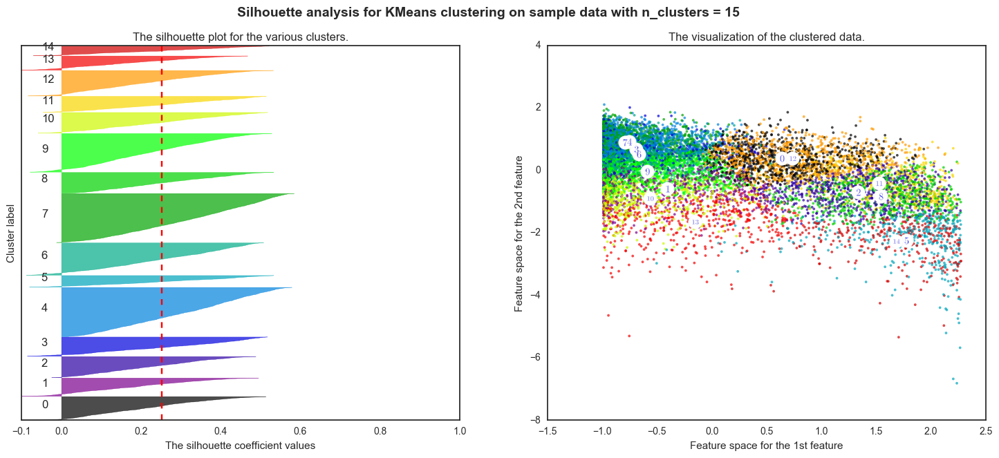

In [145]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.cm as cm


print(__doc__)

# Generating the sample data from make_blobs

range_n_clusters = [2,3,4,5,6,7,8,9,10,11,12,13,14,15]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X3) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X3)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X3, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X3, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X3[:, 0], X3[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors)

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1],
                marker='o', c="white", alpha=1, s=200)

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1, s=50)

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

    plt.show()

In [146]:
loud_acou_danceability = pd.concat([af, Xk3],axis=1)

In [151]:
loud_acou_danceability[loud_acou_danceability['cluster'] ==0]

,Artist,Title,id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,...,loudness,mode,speechiness,tempo,time_signature,valence,0,1,2,cluster
4,My Chemical Romance,I'm Not Okay (I Promise),7lRlq939cDG4SzWOF4VAnd,67,0.006020,0.210,186480,0.940,0.000000,9,...,-3.427,1,0.1230,179.722,4.0,0.2540,-0.968839,1.245509,-2.408769,0
8,Goo Goo Dolls,Name,1G8jae4jD8mwkXdodqHsBM,59,0.069100,0.464,270000,0.701,0.001820,9,...,-5.943,1,0.0341,73.970,4.0,0.4060,-0.762153,0.580241,-0.708620,0
10,Cats On Trees,Sirens Call,39mFHYM8K21BtSp2GfQjUG,45,0.510000,0.510,223947,0.671,0.000002,2,...,-6.723,0,0.0266,135.984,4.0,0.2710,0.682487,0.373998,-0.400718,0
11,Roxette,Sleeping In My Car,0CicjlSiN0HdzD2nigN9j4,44,0.012300,0.546,214160,0.850,0.000000,6,...,-4.315,1,0.0322,135.162,4.0,0.5820,-0.948262,1.010709,-0.159752,0
13,Maren Morris,Rich,0MvdlqGaeUMHowYxwagXeT,54,0.044500,0.565,208893,0.855,0.000000,5,...,-4.189,1,0.0557,74.980,4.0,0.8570,-0.842756,1.044025,-0.032576,0
15,Martha And The Muffins,Echo Beach,49wHCjiu34kM3VRgumQ1tJ,44,0.130000,0.540,219867,0.746,0.000009,7,...,-9.412,1,0.0450,163.809,4.0,0.8090,-0.562610,-0.337014,-0.199913,0
16,The Pretty Reckless,My Medicine,4U0nhramvy2HXuNcsug8Dk,48,0.002860,0.439,193987,0.900,0.000000,10,...,-2.161,0,0.2450,149.996,4.0,0.3940,-0.979193,1.580258,-0.875957,0
19,Glee,What I Did for Love,3mpXZcuekTsQVBYIt4vu1T,36,0.462000,0.281,222373,0.404,0.000004,8,...,-7.520,1,0.0330,76.084,4.0,0.0912,0.525212,0.163259,-1.933530,0
24,Hannah Montana,I'll Always Remember You,60c0p6GGnuwdKcQnmuM2zC,55,0.047300,0.404,233333,0.792,0.000000,8,...,-2.670,1,0.0391,144.130,4.0,0.3060,-0.833582,1.445671,-1.110230,0
26,Blue Diamonds,Ramona,2Xt3YSFvqe5AzRbVrETVbv,29,0.152000,0.493,147924,0.603,0.000092,4,...,-9.824,1,0.0411,139.130,4.0,0.6700,-0.490525,-0.445952,-0.514508,0


In [149]:
loud_acou_danceability[loud_acou_danceability['cluster'] ==1].head()

,Artist,Title,id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,...,loudness,mode,speechiness,tempo,time_signature,valence,0,1,2,cluster
1,Dr. Hook & The Medicine Show,Walk Right In,6v9UOHsr45DOHTV5ktvNRc,19,0.0388,0.808,185760,0.948,0.002400,2,...,-5.375,1,0.0386,114.734,4.0,0.877,-0.861433,0.730429,1.593945,1
2,Eddie Cochran,C'mon Everybody,7Lfp7FsKI4buEJYbMlt7QU,44,0.1340,0.633,116560,0.699,0.000146,3,...,-10.612,1,0.0429,175.302,4.0,0.896,-0.549503,-0.654311,0.422582,1
3,Beyoncé,Ego,6GcuA4J9ruyClBizBd4m5E,58,0.1550,0.623,236360,0.389,0.000000,1,...,-7.816,1,0.2410,79.454,4.0,0.506,-0.480695,0.084992,0.355647,1
5,Jack Johnson,Someday At Christmas,6ShAxK5egTFaalJMty15Si,50,0.6120,0.801,130760,0.192,0.000000,0,...,-10.282,1,0.0557,104.189,4.0,0.594,1.016698,-0.567054,1.547090,1
6,Randy Travis,An Old Pair Of Shoes,5gwAf1bzkN7k22GQMopCQ9,0,0.1410,0.762,171632,0.345,0.001370,3,...,-11.314,1,0.0288,120.781,4.0,0.684,-0.526567,-0.839931,1.286044,1


In [150]:
loud_acou_danceability[loud_acou_danceability['cluster'] ==2].head()

,Artist,Title,id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,...,loudness,mode,speechiness,tempo,time_signature,valence,0,1,2,cluster
0,Elvis Presley,You Don't Know Me,4BWVBdeEiPcXP5KVcWCeO3,26,0.9240,0.407,147360,0.220,0.029800,11,...,-15.468,1,0.0410,83.605,3.0,0.219,2.038988,-1.938310,-1.090149,2
14,Little Shop Of Horrors,Somewhere That's Green,7CURZrxixLSuW41vklxQFk,36,0.8640,0.466,250587,0.110,0.000000,7,...,-15.872,1,0.0634,101.211,4.0,0.222,1.842394,-2.045133,-0.695233,2
17,Roger Whittaker,Yellow Bird,4gjRjLWZBEQe8tiBhOiJfL,0,0.0718,0.745,141098,0.159,0.851000,0,...,-28.190,1,0.0539,114.291,4.0,0.510,-0.753306,-5.302195,1.172254,2
18,Teach-In,Ding-A-Dong,4ARCWS3l327M1YulCf74Uu,31,0.5120,0.708,149573,0.561,0.000002,9,...,-15.148,0,0.0367,139.199,4.0,0.938,0.689041,-1.853697,0.924595,2
21,Bon Jovi,Bed Of Roses (Acoustic),316AJrVNhDSMhLy7pfEdNf,18,0.8400,0.499,348720,0.241,0.000000,5,...,-10.109,1,0.0322,166.061,3.0,0.160,1.763756,-0.521311,-0.474347,2
